In [1]:
from fastai.vision import *
from PIL import Image
import os
import pandas as pd
from tqdm import tqdm
import random
from fastai.callbacks import SaveModelCallback


C:\Users\kingsun\Anaconda3\envs\fastai\lib\site-packages\requests\__init__.py:91: RequestsDependencyWarning: urllib3 (1.25.3) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


In [2]:
# from PIL import ImageFile
# ImageFile.LOAD_TRUNCATED_IMAGES = True

In [3]:
from fastai.widgets import *


In [4]:
import fastai
fastai.__version__

'1.0.54'

In [18]:
tags = ['0: Bar','1: Bathroom','2: Bedroom','3: Breakfast','4: City View',
'5: Dining','6: Hotel Front','7: Hotel Exterior View','8: Hotel Interior View',
'9: Kitchen','10: Living Room','11: Lobby','12: Natural View','13: Pool',
'14: Recreation','15: Sports']
def get_tag(tag_int):
    return tags[tag_int]
    

In [5]:
get_ipython().config.get('IPKernelApp', {})['parent_appname'] = ""

In [6]:
base_dir = os.getcwd()
data_dir = os.path.join(os.getcwd(), "data")
resized_dir = os.path.join(data_dir, "resized")
raw_dir = os.path.join(os.getcwd(), "data", "raw")
train_dir = os.path.join(os.getcwd(), "data", "train")
test_dir = os.path.join(os.getcwd(), "data", "test_")
custom_dir = os.path.join(data_dir, "sorted_v2")

### analisis training set

In [21]:
labels_df = pd.read_csv(base_dir + '//train.csv')
labels_df.drop(labels_df.columns[0], axis=1, inplace=True)
labels_df['tag_name'] = labels_df.tag.map(get_tag)
labels_df.groupby('tag_name').count().sort_values('tag', ascending=False)

,fileName,tag
tag_name,,
2: Bedroom,4874,4874
1: Bathroom,1146,1146
7: Hotel Exterior View,977,977
6: Hotel Front,832,832
8: Hotel Interior View,794,794
12: Natural View,693,693
11: Lobby,692,692
3: Breakfast,671,671
4: City View,529,529


In [7]:
tfms = get_transforms()


In [8]:
data = ImageDataBunch.from_folder(custom_dir,\
                               valid_pct=0.2,\
                               seed=2019,\
                               size=224,\
                               ds_tfms=tfms,\
                               num_workers=5,\
                               bs=64
                              ).normalize(imagenet_stats);
# data = ImageDataBunch.from_csv(base_dir,\
#                                csv_labels='cleaned.csv',\
#                                valid_pct=0.2,\
#                                seed=2019,\
#                                size=224,\
#                                ds_tfms=tfms,\
#                                fn_col=0,\
#                                label_col=1,\
#                                num_workers=5,\
#                                bs=64
#                               ).normalize(imagenet_stats);


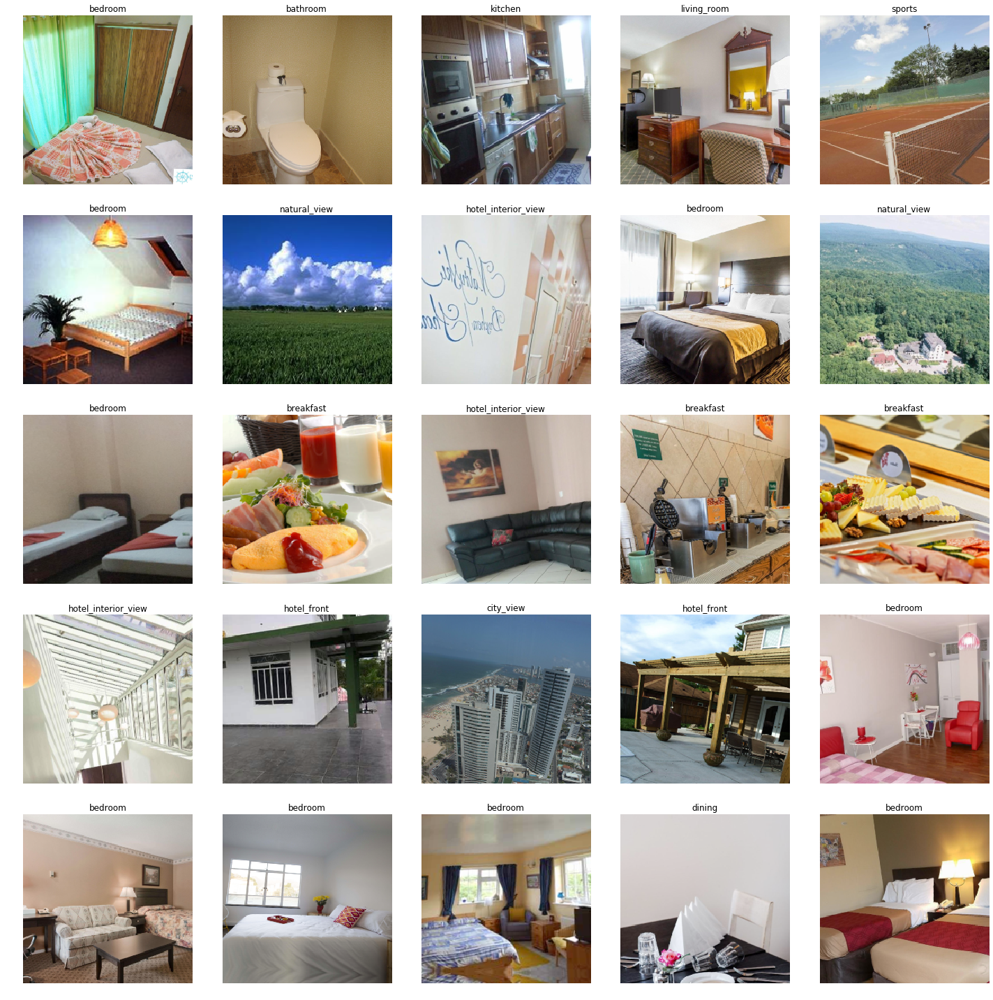

In [11]:
data.show_batch()

In [9]:
learn = cnn_learner(data, models.resnet50, metrics=Recall(average='macro'), ps=0.7)


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.10E-02
Min loss divided by 10: 1.20E-02


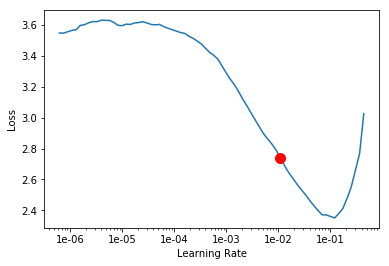

In [10]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,recall,time
0,1.560445,0.816738,0.618818,03:28
1,0.987823,0.654635,0.682732,03:24
2,0.777119,0.640053,0.688429,03:25
3,0.746133,0.657314,0.686502,03:25
4,0.693552,0.673692,0.686843,03:26
5,0.692549,0.702753,0.691234,03:24
6,0.630518,0.618539,0.686270,03:23
7,0.590082,0.619754,0.726737,03:23
8,0.538256,0.593558,0.717825,03:23
9,0.485048,0.593438,0.740483,03:22


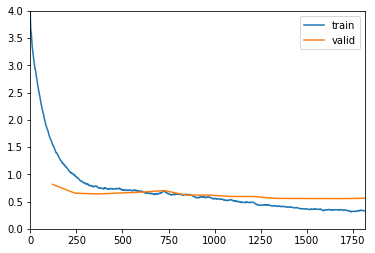

In [11]:
learn.fit_one_cycle(15,  3e-03,\
                    callbacks=[SaveModelCallback(learn, every='epoch', monitor='valid_loss'),\
                               ShowGraph(learn)])

epoch,train_loss,valid_loss,recall,time
0,1.398220,0.798330,0.635208,03:27
1,0.903117,0.672939,0.703570,03:24
2,0.744836,0.617112,0.705127,03:25
3,0.642528,0.563748,0.732919,03:29
4,0.574358,0.554696,0.737266,03:22
5,0.512383,0.554858,0.728170,03:23


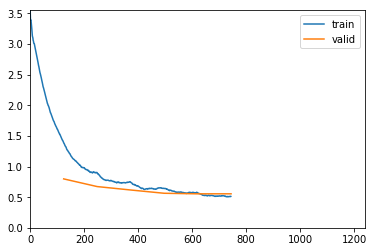

KeyboardInterrupt: 

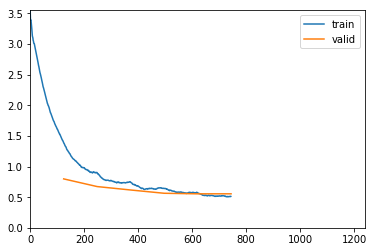

In [59]:
# learn.fit_one_cycle(10, 1.74E-03,\
#                     callbacks=[SaveModelCallback(learn, every='epoch', monitor='valid_loss'),\
#                                ShowGraph(learn)])

In [12]:
learn.save('final1')

In [66]:
learn.load('bestmodel_7')

Learner(data=ImageDataBunch;

Train: LabelList (7981 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
bar,bar,bar,bar,bar
Path: C:\Users\kingsun\workspace\despegar2019;

Valid: LabelList (1995 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
bedroom,bathroom,lobby,bedroom,bathroom
Path: C:\Users\kingsun\workspace\despegar2019;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, 

In [16]:
# learn.lr_find()
# learn.recorder.plot(suggestion=True)

In [17]:
# learn.fit_one_cycle(2, 1.58E-06,\
#                     callbacks=[ShowGraph(learn)])

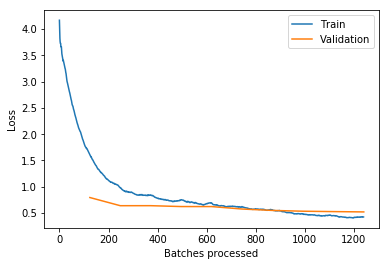

In [67]:
learn.recorder.plot_losses()

### unfreeze

In [19]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 7.59E-07
Min loss divided by 10: 9.12E-08


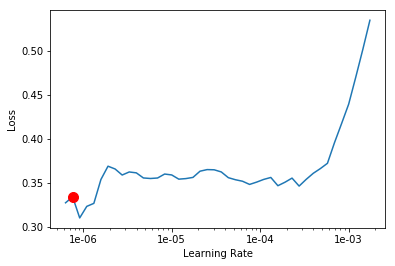

In [20]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [28]:
learn.unfreeze()

In [ ]:
learn.lr_find()
learn.recorder.plot(suggestion=True)
lr = learn.recorder.min_grad_lr

In [21]:
learn.fit_one_cycle(3, 7.59E-07,
                   callbacks=[SaveModelCallback(learn, every='epoch', monitor='valid_loss'),\
                               ShowGraph(learn)])
# learn.fit_one_cycle(3, max_lr=slice(3.31E-06, 3e-04))

epoch,train_loss,valid_loss,recall,time
0,0.401392,0.529853,0.760283,04:10
1,0.371093,0.530862,0.760779,04:09
2,0.359955,0.528884,0.762797,04:09


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
Min loss divided by 10: 1.10E-05


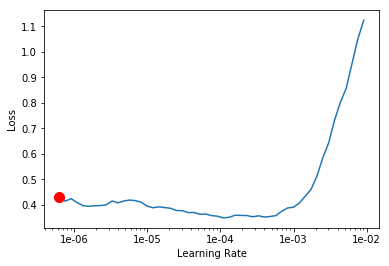

In [22]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [23]:
learn.save('stage-2')

epoch,train_loss,valid_loss,recall,time
0,0.416163,0.550541,0.743641,04:07
1,0.400223,0.528702,0.760724,04:05
2,0.289486,0.520528,0.767768,04:06


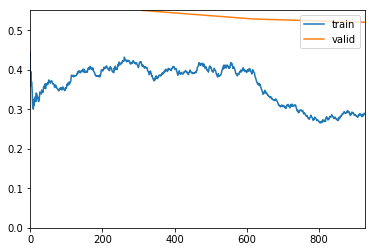

In [25]:
learn.fit_one_cycle(3,  max_lr=slice(2e-05, 1e-04),
                   callbacks=[SaveModelCallback(learn, every='epoch', monitor='valid_loss'),\
                               ShowGraph(learn)])

In [26]:
learn.save('stage-3')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
Min loss divided by 10: 7.59E-08


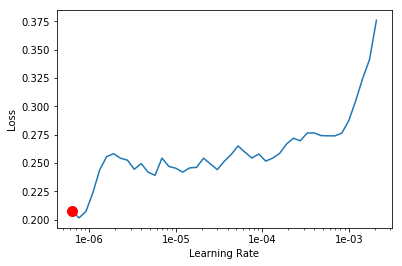

In [31]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,recall,time
0,0.273368,0.517778,0.771720,04:10
1,0.255409,0.516351,0.776952,04:09
2,0.250436,0.515826,0.778522,04:07


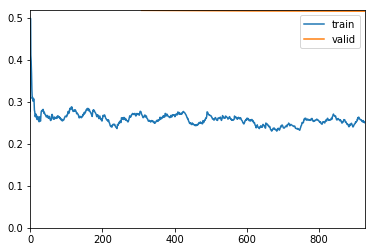

In [32]:
learn.fit_one_cycle(3,  6.31E-07,
                   callbacks=[SaveModelCallback(learn, every='epoch', monitor='valid_loss'),\
                               ShowGraph(learn)])

In [34]:
learn.save('stage-4')

In [12]:
learn.load('stage-4')

Learner(data=ImageDataBunch;

Train: LabelList (9888 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
bar,bar,bar,bar,bar
Path: C:\Users\kingsun\workspace\despegar2019;

Valid: LabelList (2471 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
natural_view,bedroom,bedroom,recreation,sports
Path: C:\Users\kingsun\workspace\despegar2019;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=

#### best recall 0.7294

### img cleaner

In [35]:
ds, idxs = DatasetFormatter().from_toplosses(learn, n_imgs=300)

In [43]:
ImageCleaner(ds, idxs, base_dir, batch_size=3)

'No images to show :)'

#### creo nuevo archivo de train

In [44]:
new_train = pd.read_csv('cleaned.csv')

In [45]:
new_train.to_csv('cleaned.csv', index=False)

In [256]:
tags

['0: Bar',
 '1: Bathroom',
 '2: Bedroom',
 '3: Breakfast',
 '4: City View',
 '5: Dining',
 '6: Hotel Front',
 '7: Hotel Exterior View',
 '8: Hotel Interior View',
 '9: Kitchen',
 '10: Living Room',
 '11: Lobby',
 '12: Natural View',
 '13: Pool',
 '14: Recreation',
 '15: Sports']

'No images to show :)'

In [65]:
def sample_by_class(selected_class, q_samples):
    class_imgs = []
    for i, item in enumerate(data.train_ds.y):
        if item.data == selected_class:
            class_imgs.append(i)
    class_imgs_sample =  random.sample(class_imgs, q_samples)
    data.show_xys(xs=[x for x in data.train_ds.x[class_imgs_sample]],\
                  ys=[x for x in data.train_ds.y[class_imgs_sample]],
                  title = get_tag(selected_class) )
    


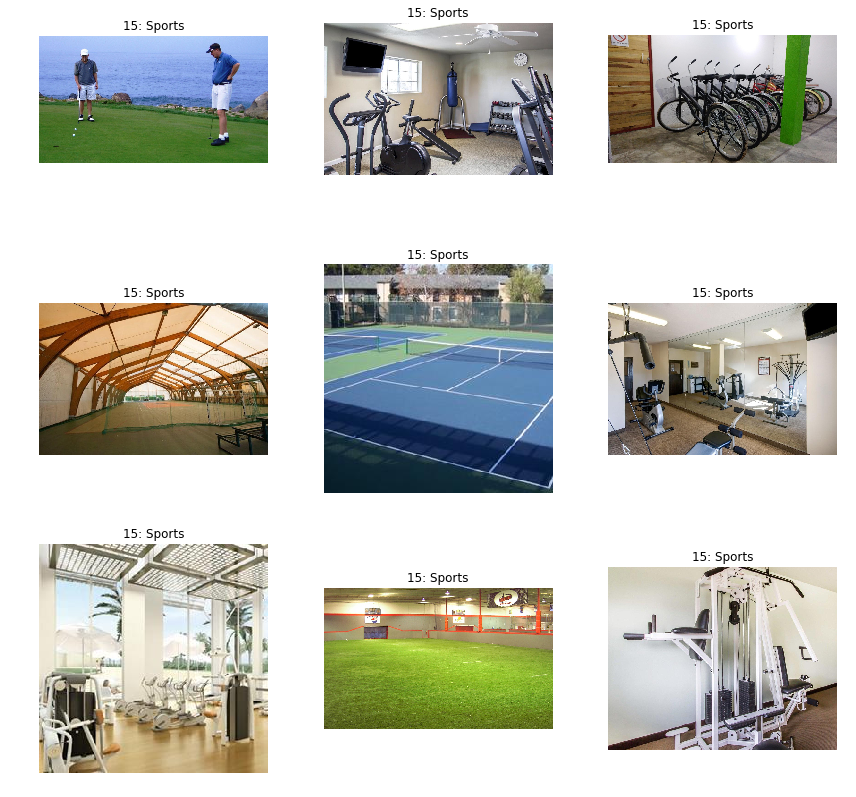

In [129]:
sample_by_class(selected_class=15, q_samples=9)

### predigo

In [17]:
learn.export()

In [15]:
test_list = ImageList.from_folder(test_dir)

In [19]:
learn_pred = load_learner("data\\sorted_v2\\", test = test_list)

In [73]:
learn_pred

Learner(data=ImageDataBunch;

Train: LabelList (0 items)
x: ImageList

y: CategoryList

Path: .;

Valid: LabelList (0 items)
x: ImageList

y: CategoryList

Path: .;

Test: LabelList (9955 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: ., model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(6

In [20]:
preds, y = learn_pred.get_preds(ds_type=DatasetType.Test)
y = torch.argmax(preds, dim=1)

In [149]:
lista = [i for i in range(0, len(test_list))]

1: Bathroom


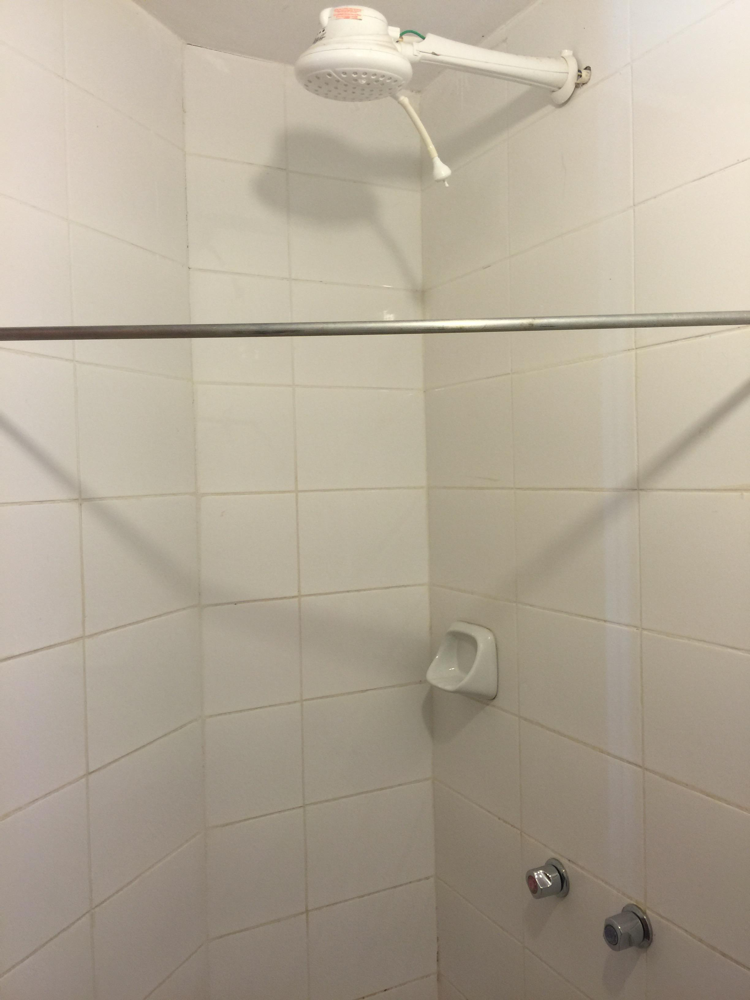

In [368]:
s =  random.sample(lista, 1)
print(get_tag(y[s]))
test_list[s[0]]

In [105]:
label_cls.items

AttributeError: type object 'CategoryList' has no attribute 'items'

In [80]:
def sample_by_class(selected_class, q_samples):
    class_imgs = []
    for i, item in enumerate(data.train_ds.y):
        if item.data == selected_class:
            class_imgs.append(i)
    class_imgs_sample =  random.sample(class_imgs, q_samples)
    data.show_xys(xs=[x for x in data.train_ds.x[class_imgs_sample]],\
                  ys=[x for x in data.train_ds.y[class_imgs_sample]],
                  title = get_tag(selected_class) )

ImageList (9955 items)
Image (3, 383, 510),Image (3, 800, 1000),Image (3, 351, 512),Image (3, 667, 1000),Image (3, 667, 1000)
Path: C:\Users\kingsun\workspace\despegar2019\data\test_

### creo results

In [21]:
predicts = []
dirs = os.listdir(test_dir)
for filename in dirs:
    predicts.append(filename.split('.')[0])
        
preds_df = pd.DataFrame()
preds_df['id'] = predicts
preds_df['id'] = preds_df['id']
preds_df['target'] = y
preds_df.to_csv('results.csv', header=None, index=False)

In [31]:
interp = ClassificationInterpretation.from_learner(learn)


In [45]:
# actual, predicted, number of occurrences.
pd.DataFrame([[get_tag(x[0]), get_tag(x[1]), x[2]] for x in interp.most_confused()],\
             columns =['actual', 'predicted', 'q'])[0:10]

TypeError: list indices must be integers or slices, not str

In [32]:
print(get_tag(4))
print(get_tag(7))

4: City View
7: Hotel Exterior View


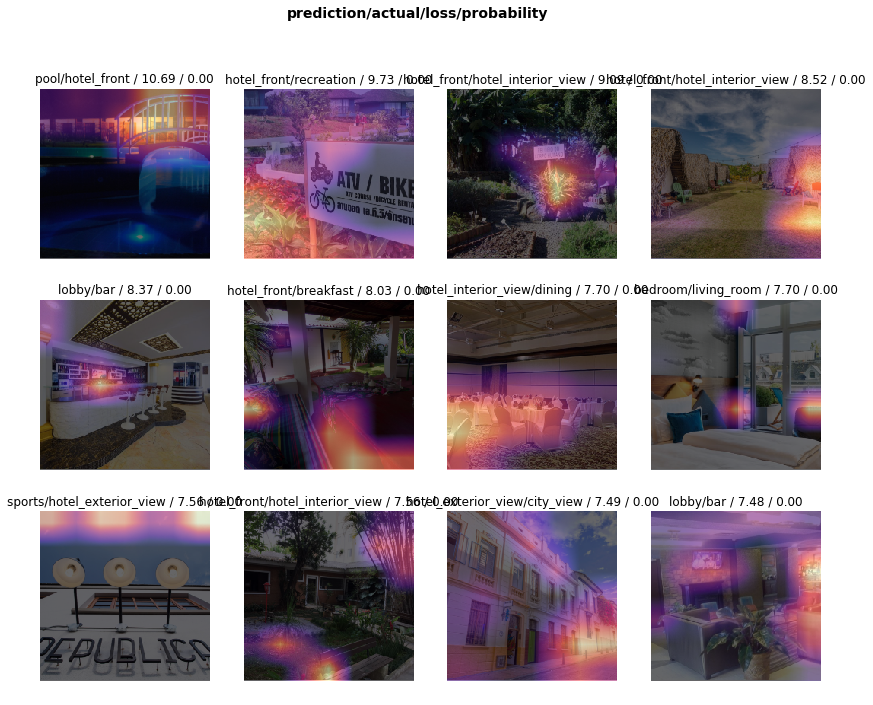

In [33]:
interp.plot_top_losses(12, figsize=(14,11))


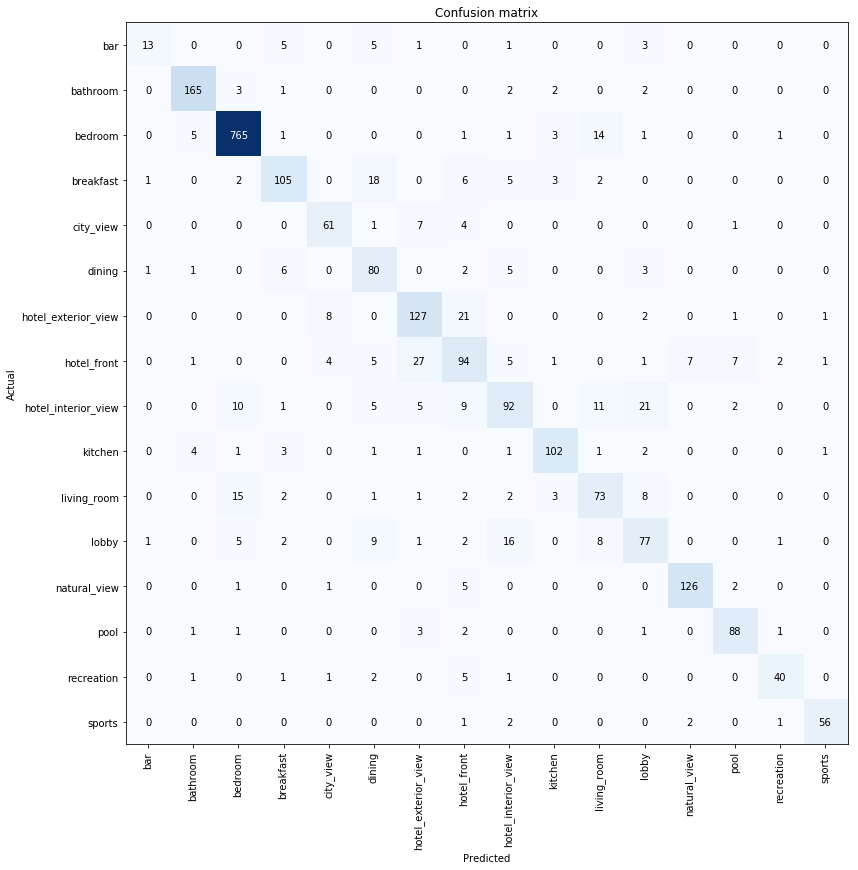

In [42]:
interp.plot_confusion_matrix(figsize=(12,12))


In [34]:
interp.most_confused()

[('hotel_front', 'hotel_exterior_view', 27),
 ('hotel_exterior_view', 'hotel_front', 21),
 ('hotel_interior_view', 'lobby', 21),
 ('breakfast', 'dining', 18),
 ('lobby', 'hotel_interior_view', 16),
 ('living_room', 'bedroom', 15),
 ('bedroom', 'living_room', 14),
 ('hotel_interior_view', 'living_room', 11),
 ('hotel_interior_view', 'bedroom', 10),
 ('hotel_interior_view', 'hotel_front', 9),
 ('lobby', 'dining', 9),
 ('hotel_exterior_view', 'city_view', 8),
 ('living_room', 'lobby', 8),
 ('lobby', 'living_room', 8),
 ('city_view', 'hotel_exterior_view', 7),
 ('hotel_front', 'natural_view', 7),
 ('hotel_front', 'pool', 7),
 ('breakfast', 'hotel_front', 6),
 ('dining', 'breakfast', 6),
 ('bar', 'breakfast', 5),
 ('bar', 'dining', 5),
 ('bedroom', 'bathroom', 5),
 ('breakfast', 'hotel_interior_view', 5),
 ('dining', 'hotel_interior_view', 5),
 ('hotel_front', 'dining', 5),
 ('hotel_front', 'hotel_interior_view', 5),
 ('hotel_interior_view', 'dining', 5),
 ('hotel_interior_view', 'hotel_ext